# Run run_peat_TCZE_OP2_TSNB_ALL

TCZERO bug corrected (over the snow-free fraction; https://gitlab.com/cccma/classic/-/issues/119)

Test TCZERO bellow the snow pack and computation of TSNBOT

- **TCZERO** ([soilHeatFluxPrep.f90](https://gitlab.com/cccma/classic/-/blob/master/src/soilHeatFluxPrep.f90?ref_type=heads#L124))

```
      if (ZSNOW(I) > 0.0) then
        !! TCZE_REF
        ! TCZERO = 1.0 / (0.5 / TCSNOW(I) + 0.5 / TCTOP(I,1))
        !! TCZE_OP1
        ! TCZERO = TCTOP(I,1)
        !! TCZE_OP2
        ! TCZERO = (1.0/ZSNOW(I) + 1.0/DELZ(1)) / ((1.0/ZSNOW(I))/TCSNOW(I) + (1.0/DELZ(1))/TCTOP(I,1))
        !! TCZE_OP3
        ! TCZERO = (ZSNOW(I) + DELZ(1)) / (ZSNOW(I)/TCSNOW(I) + DELZ(1)/TCTOP(I,1))
      else
        TCZERO = TCTOP(I,1)
      end if
```

- **TSNBOT** ([snowTempUpdate.f90](https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139))

```
      !! TSNB_REF
      ! TSNBOT(I) = (ZSNOW(I) * TSNOW(I) + DELZ(1) * TBAR(I,1)) / &
      !             (ZSNOW(I) + DELZ(1))
      !! TSNB_OP1
      ! TSNBOT(I) = (1 / ZSNOW(I) * TSNOW(I) + 1 / DELZ(1) * TBAR(I,1)) / &
      !             (1 / ZSNOW(I) + 1 / DELZ(1))
      !! TSNB_OP2
      ! TSNBOT(I) = (TCSNOW(I) / ZSNOW(I) * TSNOW(I) + TCTOP(I,1) / DELZ(1) * TBAR(I,1)) / &
      !             (TCSNOW(I) / ZSNOW(I) + TCTOP(I,1) / DELZ(1))
      !! TSNB_OP3
      !! Same as in src/soilHeatFluxPrep.f90
      !! TCZE_REF
      ! TCZERO = 1.0 / (0.5 / TCSNOW(I) + 0.5 / TCTOP(I,1))
      !! TCZE_OP1
      ! TCZERO = TCTOP(I,1)
      !! TCZE_OP2
      ! TCZERO = (1.0/ZSNOW(I) + 1.0/DELZ(1)) / ((1.0/ZSNOW(I))/TCSNOW(I) + (1.0/DELZ(1))/TCTOP(I,1))
      !! TCZE_OP3
      ! TCZERO = (ZSNOW(I) + DELZ(1)) / (ZSNOW(I)/TCSNOW(I) + DELZ(1)/TCTOP(I,1))
      ! TSNBOT(I) = (TCSNOW(I) / ZSNOW(I) * TSNOW(I) + TCZERO / DELZ(1) * TBAR(I,1)) / &
                  (TCSNOW(I) / ZSNOW(I) + TCZERO / DELZ(1))
      !! TSNB_OP4
      ! TSNBOT(I) = 0.2*TSNOW(I)+0.8*TBAR(I,1)
      !! TSNB_OP5
      ! TSNBOT(I) = TSURF(I)-GSNOLD*ZSNOW(I)/(2.0*TCSNOW(I))

```


In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xskillscore as xs
import calendar
import os

In [2]:
site = 'byl'
site_longname = 'Bylot Island, Canadian high Arctic'
y_start = 2013
y_end = 2019

# labels = ['peat_30min_ext', 'peat']
labels = [
    'peat_TCZE_OP2_TSNB_REF', 
    'peat_TCZE_OP2_TSNB_OP1', 
    'peat_TCZE_OP2_TSNB_OP2', 
    'peat_TCZE_OP2_TSNB_OP3', 
    'peat_TCZE_OP2_TSNB_OP4', 
    'peat_TCZE_OP2_TSNB_OP5', 
    'peat_TCZE_REF_TSNB_REF', 
]

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowArctic/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
# ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowArctic/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    # ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

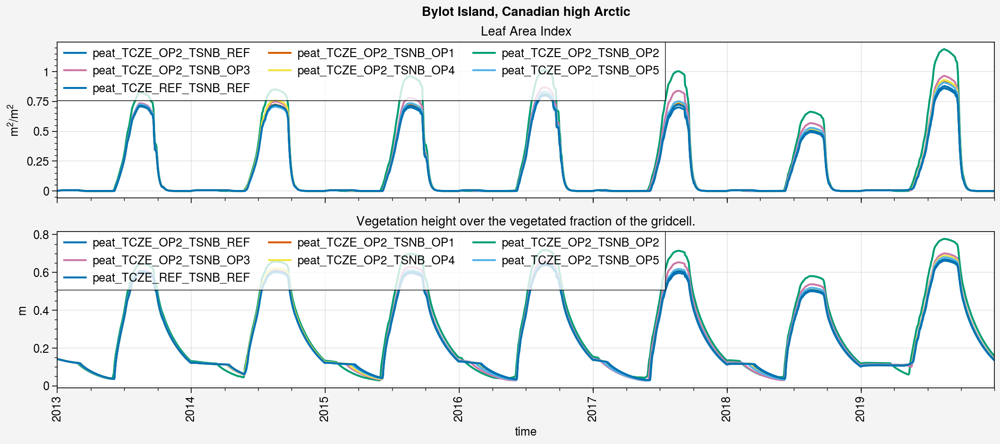

In [6]:
%matplotlib inline
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2013-2019)')

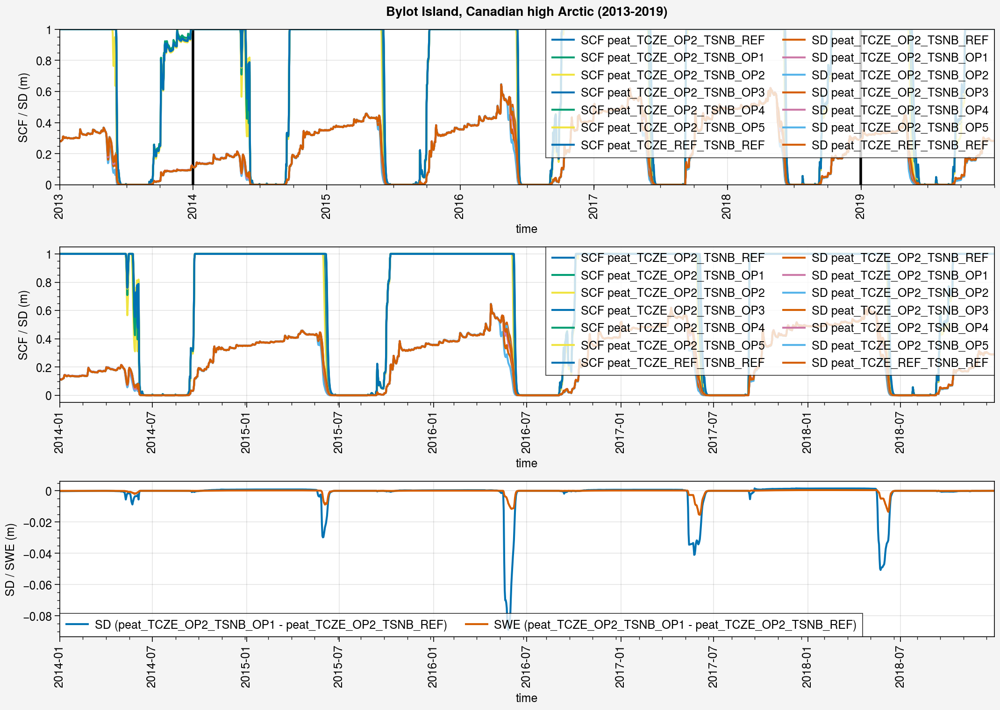

In [7]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+1)
end = str(y_end-1)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


## Compare with obs

In [8]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot'

ds_h_obs = xr.open_dataset(path_obs+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_h_obs['albs'] = ds_h_obs.albs.where(ds_h_obs.flag_albs_ERA5 == 0).where(ds_h_obs.albs < 1) # to avoid > 1 albedo values
ds_d_obs = ds_h_obs.resample(time='D').mean().load()
ds_h_met = xr.open_dataset(path_obs+'/met_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()

ds_h_obs

<xarray.Dataset> Size: 10MB
Dimensions:         (time: 52202, sdepth: 5, sheight: 10)
Coordinates:
  * time            (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-...
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
Data variables:
    snd_auto        (time) float64 418kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 418kB 0.16 0.15 0.17 0.16 ... 0.17 0.16 0.16
    flag_albs_ERA5  (time) int64 418kB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    ts              (time) float64 418kB 9.86 10.42 13.45 ... 10.71 14.89 nan
    mrsll           (sdepth, time) float64 2MB 0.2 0.2 0.2 ... 0.066 0.066 0.066
    tsl             (sdepth, time) float64 2MB 3.7 4.3 4.99 ... -0.3 -0.3 -0.3
    tsnl            (sheight, time) float64 4MB nan nan nan nan ... nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

### Get thermal conductivities

In [9]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/Bylot_validation_snow_soil_thermal_conductivity.csv', sep=';', parse_dates=['date'], index_col=['date'])
df

,SNOW 22 cm,SNOW 12 cm,SNOW 2 cm,SOIL -10 cm,SNOW 7 cm
date,,,,,
2013-07-12,NaN,NaN,NaN,0.686033,NaN
2013-07-14,NaN,NaN,NaN,0.681628,NaN
2013-07-16,NaN,NaN,NaN,0.700266,NaN
2013-07-18,NaN,NaN,NaN,0.680094,NaN
2013-07-20,NaN,NaN,NaN,0.696302,NaN
...,...,...,...,...,...
2019-06-16,NaN,NaN,NaN,0.905965,NaN
2019-06-18,NaN,NaN,NaN,0.821669,NaN
2019-06-20,NaN,NaN,NaN,0.916831,NaN


In [10]:
ds_obs_tc = df.to_xarray()
ds_obs_tc = ds_obs_tc.rename({'date': 'time'})

ds_obs_tc = ds_obs_tc.assign_coords(sheight=[0.02 , 0.12, 0.22]) 
ds_obs_tc['sheight'].attrs['long_name'] = 'height in snow'
ds_obs_tc['sheight'].attrs['units'] = 'm'

# Combine the Snow Temp. in one variable
ds_obs_tc = ds_obs_tc.assign(
    tcs=(('sheight', 'time'), [
        list(ds_obs_tc['SNOW 2 cm'].values),
        list(ds_obs_tc['SNOW 12 cm'].values),
        list(ds_obs_tc['SNOW 22 cm'].values),
    ])
)
ds_obs_tc['tcs'].attrs['long_name'] = 'Thermal conductivity of snow'
ds_obs_tc['tcs'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'


ds_obs_tc = ds_obs_tc.assign_coords(sdepth=[0.10]) 
ds_obs_tc['sdepth'].attrs['long_name'] = 'depth in soil'
ds_obs_tc['sdepth'].attrs['units'] = 'm'

ds_obs_tc = ds_obs_tc.assign(
    tc=(('sdepth', 'time'), [
        list(ds_obs_tc['SOIL -10 cm'].values),
    ])
)
ds_obs_tc['tc'].attrs['long_name'] = 'Thermal conductivity of soil'
ds_obs_tc['tc'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'

ds_obs_tc = ds_obs_tc.drop_vars({'SNOW 2 cm', 'SNOW 7 cm', 'SNOW 12 cm', 'SNOW 22 cm', 'SOIL -10 cm'})

ds_obs_tc

<xarray.Dataset> Size: 44kB
Dimensions:  (time: 1090, sheight: 3, sdepth: 1)
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
  * sheight  (sheight) float64 24B 0.02 0.12 0.22
  * sdepth   (sdepth) float64 8B 0.1
Data variables:
    tcs      (sheight, time) float64 26kB nan nan nan nan ... nan nan nan nan
    tc       (sdepth, time) float64 9kB 0.686 0.6816 0.7003 ... 0.8086 0.7879

<a list of 1 Line2D objects>

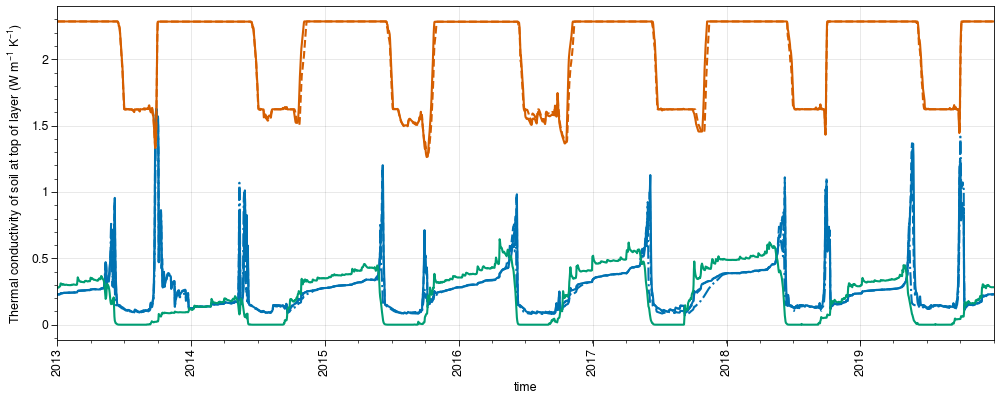

In [11]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_d_list[0].tctop.isel(layer=0))
ax.plot(ds_d_list[1].tctop.isel(layer=0), ls='--', c='C0')
ax.plot(ds_d_list[2].tctop.isel(layer=0), ls='-.', c='C0')
ax.plot(ds_d_list[0].tctop.isel(layer=1))
ax.plot(ds_d_list[1].tctop.isel(layer=1), ls='--', c='C1')
# ax.plot(ds_d_list[0].tcbot.isel(layer=0))
# ax.plot(ds_d_list[1].tcbot.isel(layer=0), ls='--', c='C2')
# ax.plot(ds_d_list[0].tcbot.isel(layer=1))
# ax.plot(ds_d_list[1].tcbot.isel(layer=1), ls='--', c='C3')
# ax.plot(ds_d_list[0].tcbot.isel(layer=2))
# ax.plot(ds_d_list[1].tcbot.isel(layer=2), ls='--', c='C4')
ax.plot(ds_d_list[0].snd)

### Get snowpits density

In [12]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/BylotDensity2014.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
df

/tmp/ipykernel_669555/1756743259.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity2014.csv', sep=';', parse_dates=['Date'], index_col=['Date'])


,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,Wet 0,23.5,240
2014-05-14,Wet 0,20.0,349
2014-05-14,Wet 0,17.0,416
2014-05-14,Wet 0,14.0,432
2014-05-14,Wet 0,11.0,419
2014-05-14,Wet 0,7.5,431
2014-05-14,Wet 0,2.0,201
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409


In [13]:
tundra_df = df[df['Location'] == 'TUNDRA']
tundra_df

,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409
2014-05-14,TUNDRA,12.0,228
2014-05-14,TUNDRA,9.0,283
2014-05-14,TUNDRA,5.0,383


/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:


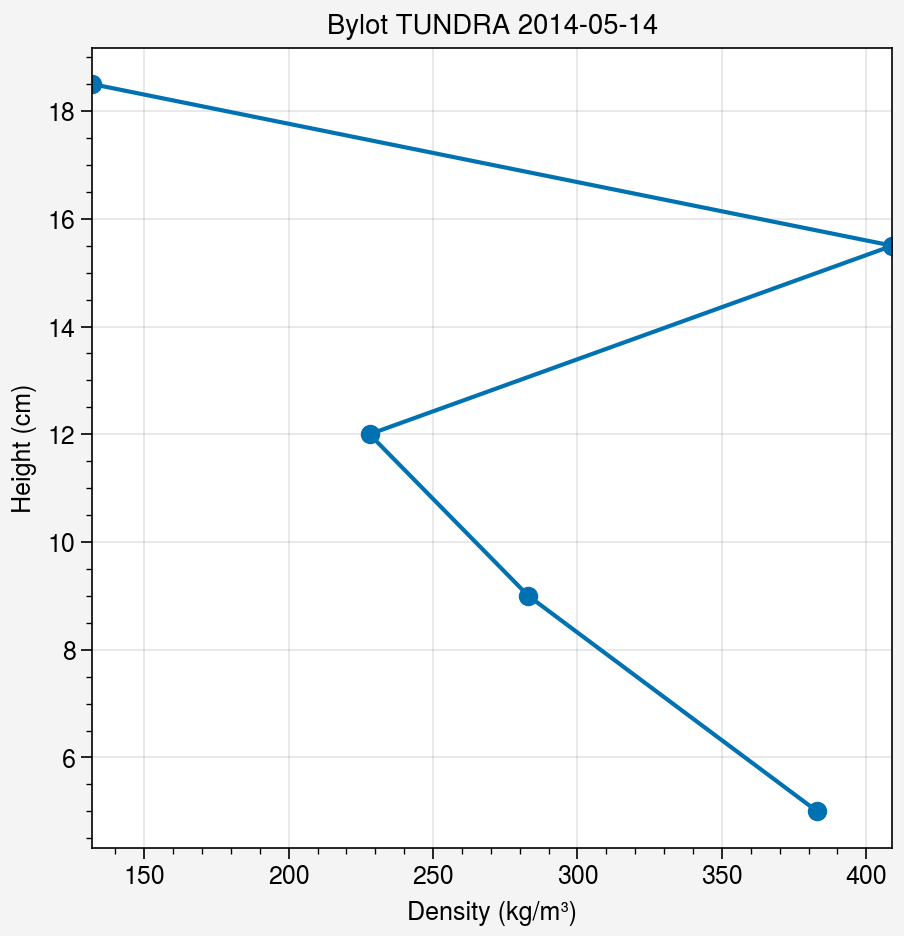

In [14]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]
ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-')
ax.format(title='Bylot TUNDRA ' + str(tundra_df.index[0])[:10],
          xlabel='Density (kg/m³)',
          ylabel='Height (cm)',
          grid=True)

In [15]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'

df_list_tundra = []
for year in ['2014', '2015', '2017', '2018', '2019']:
# for year in ['2019']:
    df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
    df_list_tundra.append(df[(df['Location'] == 'TUNDRA') | (df['Location'] == 'Tundra')])

/tmp/ipykernel_669555/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
/tmp/ipykernel_669555/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
/tmp/ipykernel_669555/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col

/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer

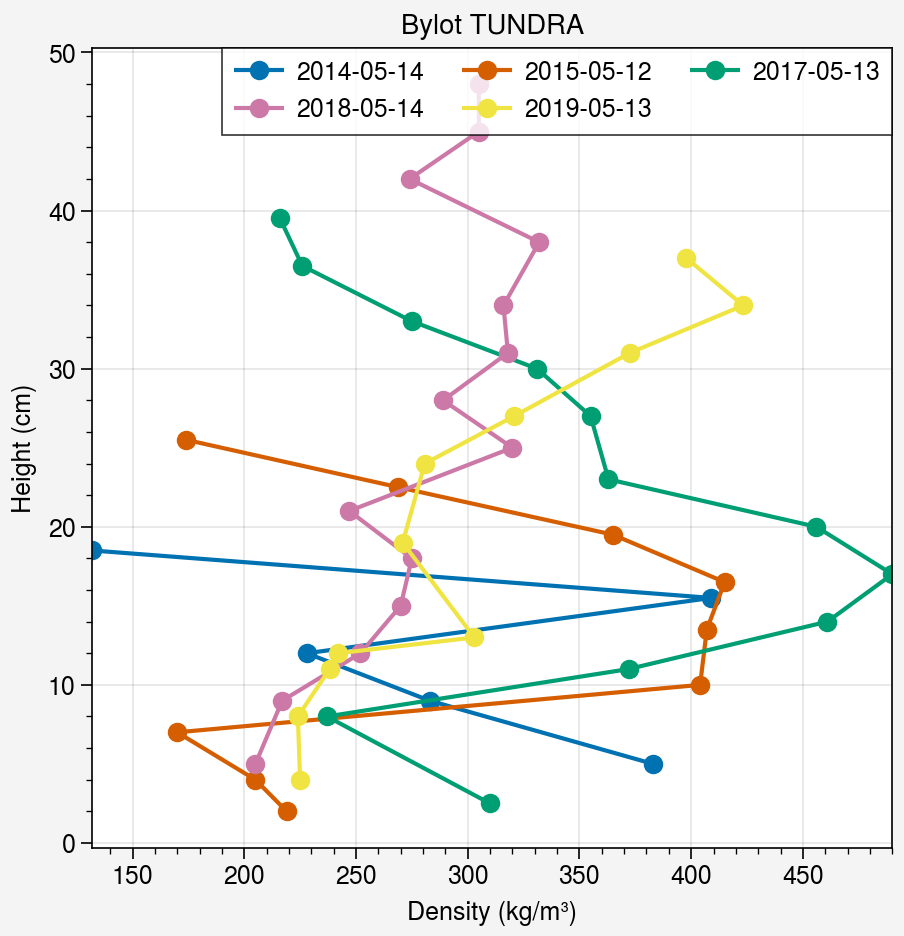

In [16]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]

for tundra_df in df_list_tundra:
    ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-', label=str(tundra_df.index[0])[:10])
ax.format(title='Bylot TUNDRA', xlabel='Density (kg/m³)', ylabel='Height (cm)', grid=True)
ax.legend()

In [17]:
df_list_tundra[1]

,Location,Height cm,Density kg m-3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
Date,,,,,,,,,,,,,
2015-05-12,Tundra,25.5,174.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,22.5,269.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,19.5,365.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,16.5,415.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,13.5,407.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,10.0,404.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,7.0,170.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,4.0,205.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,2.0,219.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df_list_tundra[1]['Height cm'].iloc[0]-df_list_tundra[1]['Height cm'].iloc[-1]

23.5

In [19]:
for tundra_df in df_list_tundra:
    print(tundra_df.index[0])
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    print('Obs : ' + str(np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz))
    print('Model : ' + str(ds_d_list[0].snwdens.sel(time=tundra_df.index[0]).values))
    print()

2014-05-14 00:00:00
Obs : 298.1296296296296
Model : 362.5363231731631

2015-05-12 00:00:00
Obs : 310.01063829787233
Model : 224.00743056762948

2017-05-13 00:00:00
Obs : 342.02702702702703
Model : 282.0817607434597

2018-05-14 00:00:00
Obs : 282.1279069767442
Model : 245.47639948156257

2019-05-13 00:00:00
Obs : 300.5924242424242
Model : 403.7648009690388



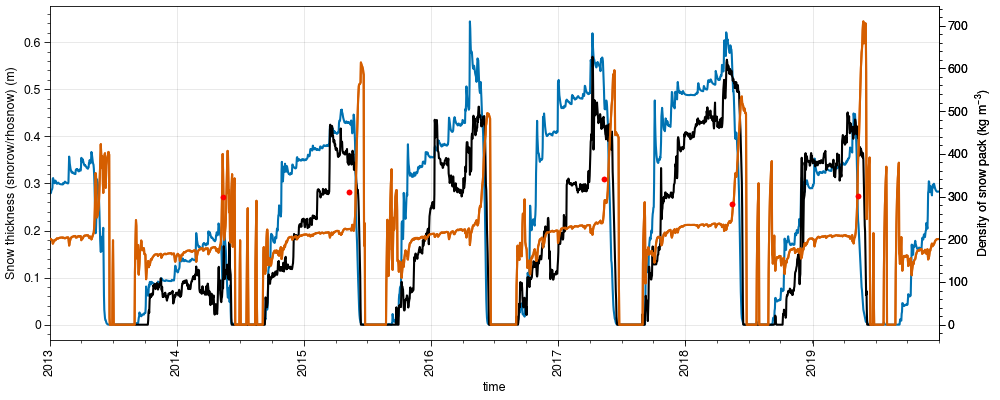

In [20]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_d_list[0].snd)
ax.plot(ds_d_obs.snd_auto, color='k')

ox = ax.alty()
ox.plot(ds_d_list[0].snwdens, color='C1')
# ox.plot(ds_d_list[0].snwdens.shift(time=15), color='C1')
for tundra_df in df_list_tundra:
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

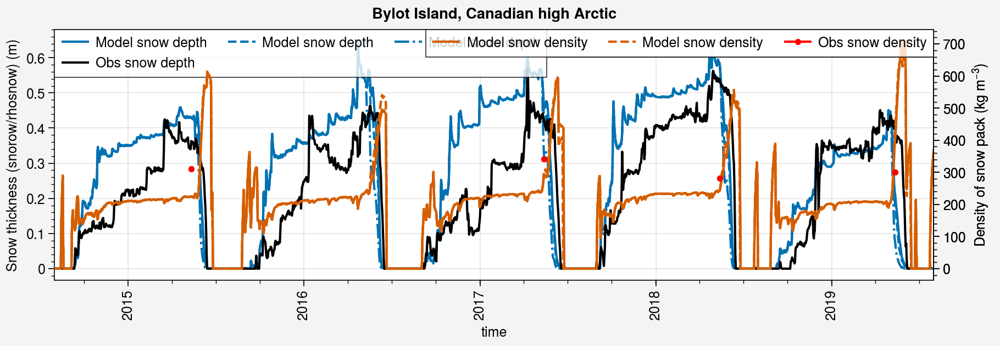

In [21]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].sel(time=period).snd, label='Model snow depth')
ax.plot(ds_d_list[1].sel(time=period).snd, label='Model snow depth', ls='--', c='C0')
ax.plot(ds_d_list[2].sel(time=period).snd, label='Model snow depth', ls='-.', c='C0')
ax.plot(ds_d_obs.sel(time=period).snd_auto, color='k', label='Obs snow depth')

ox = ax.alty()
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C1', label='Model snow density')
ox.plot(ds_d_list[1].sel(time=period).snwdens, color='C1', label='Model snow density', ls='--')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='ur')
ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend()
fig.suptitle(site_longname)
# fig.save('img/'+site+'_snd_snwdens_2014-2019.jpg')

### SD

In [22]:
path_SALIX = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot/timelapse/SALIX_F'
df_SALIX = pd.read_excel(path_SALIX+'/SnowDepth_SALIX_F.xlsx', skiprows=1, date_format='time_stamp', index_col='time_stamp')
df_SALIX.index.names = ['time']
df_SALIX

,TUNDRA,SALIX-F
time,,
2016-07-09 14:00:00,0.0,0.0
2016-07-09 15:00:00,0.0,0.0
2016-07-09 16:00:00,0.0,0.0
2016-07-09 17:00:00,0.0,0.0
2016-07-09 18:00:00,0.0,0.0
...,...,...
2019-07-05 10:00:00,0.0,0.0
2019-07-05 11:00:00,0.0,0.0
2019-07-05 12:00:00,0.0,0.0


In [23]:
ds_SALIX = df_SALIX.to_xarray()
ds_SALIX

<xarray.Dataset> Size: 628kB
Dimensions:  (time: 26185)
Coordinates:
  * time     (time) datetime64[ns] 209kB 2016-07-09T14:00:00 ... 2019-07-05T1...
Data variables:
    TUNDRA   (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    SALIX-F  (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0

In [24]:
tot_year = y_end - y_start + 1
gap = 6
years = pplt.arange(y_start, y_end)
years

array([2013, 2014, 2015, 2016, 2017, 2018, 2019])

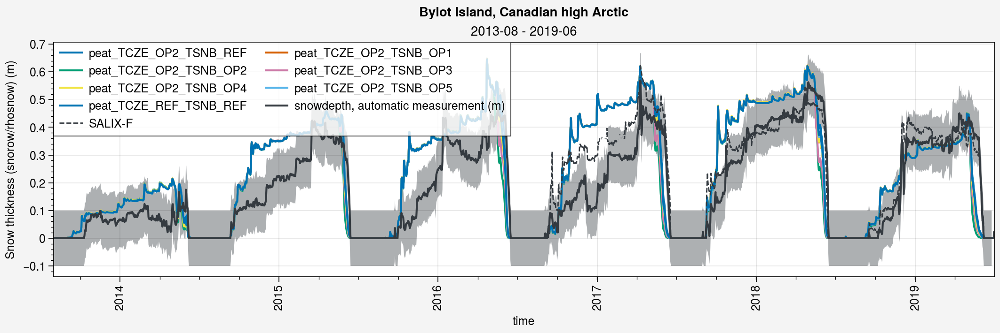

In [25]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


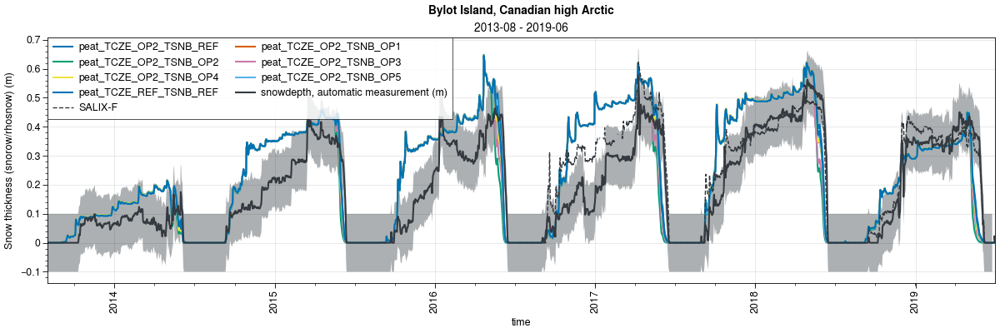

In [26]:
%matplotlib widget

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


### SWE

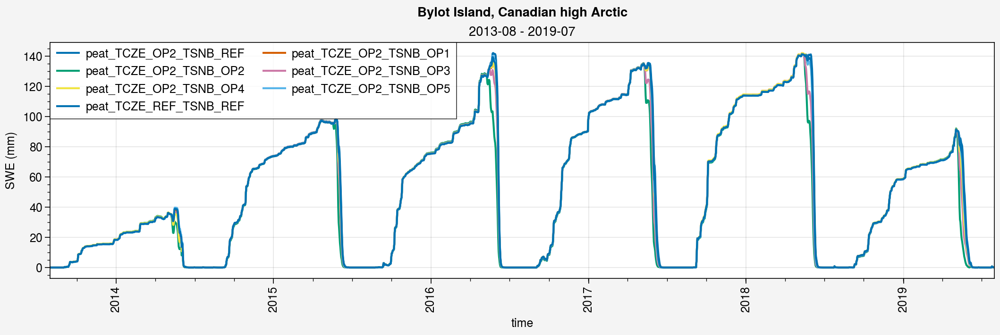

In [27]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snw.sel(time=period), label=label)
    
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values+25, axis=0),
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

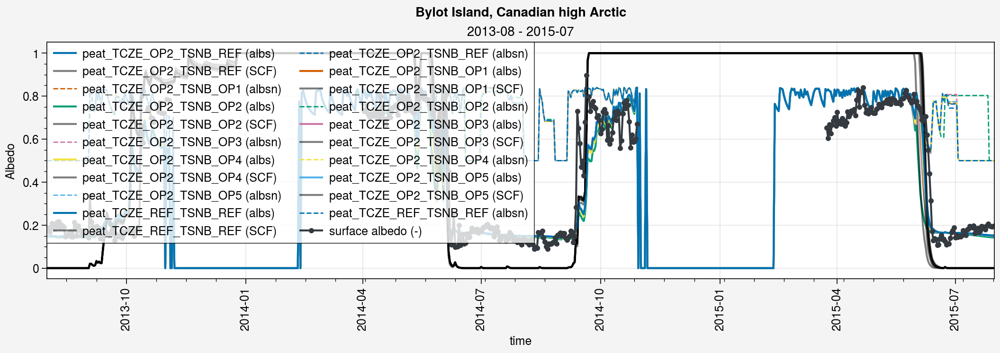

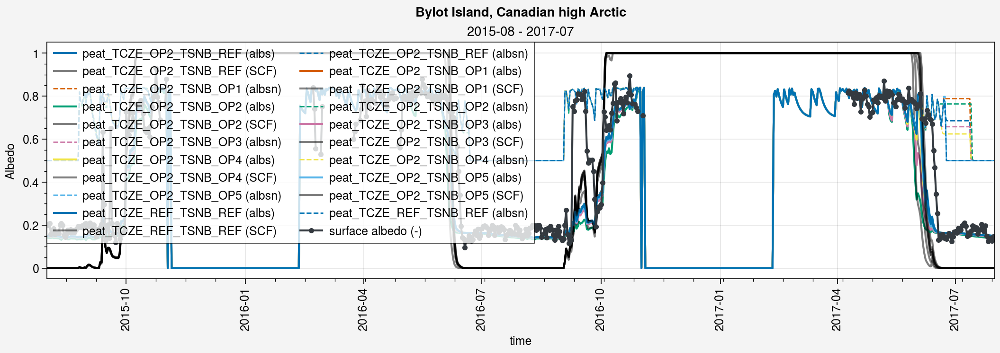

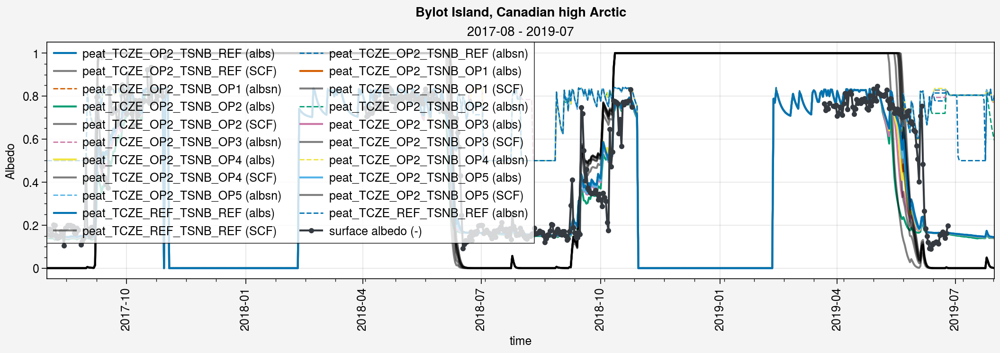

In [28]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    k = 0
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
        
        k+=1
    
    # Obs
    axs[0].plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

Domine et al. ([2019](https://onlinelibrary.wiley.com/doi/abs/10.1029/2018MS001445)): "**Averaged over a period of several days the surface temperatures are essentially the same**. The amplitude variations are greater in the Alpine snowpack (Figure 8b) because the insulating layer at the top does not allow damping the air temperature variations by heat exchanges with the snowpack. This effect is more important in April and May, when daily temperature variations reach 20 °C, sometimes more. The absolute temperature differences reaches 4.7 °C on 8 February, when the temperature suddenly increases by 15 °C in 5 hr, and the surface temperature of the Alpine snowpack increases more rapidly."

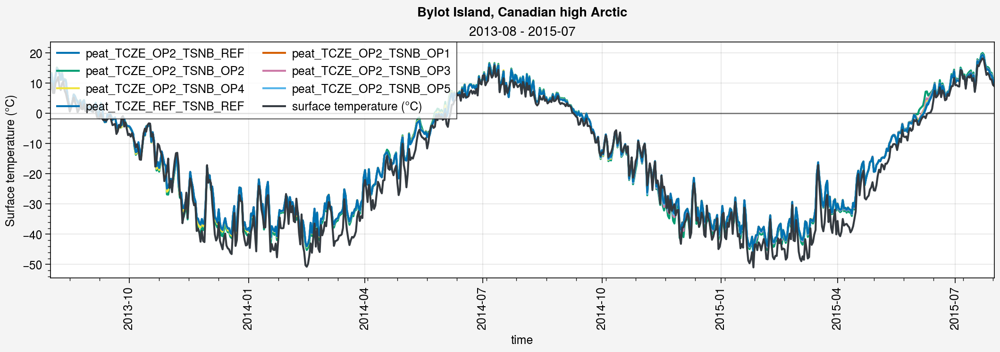

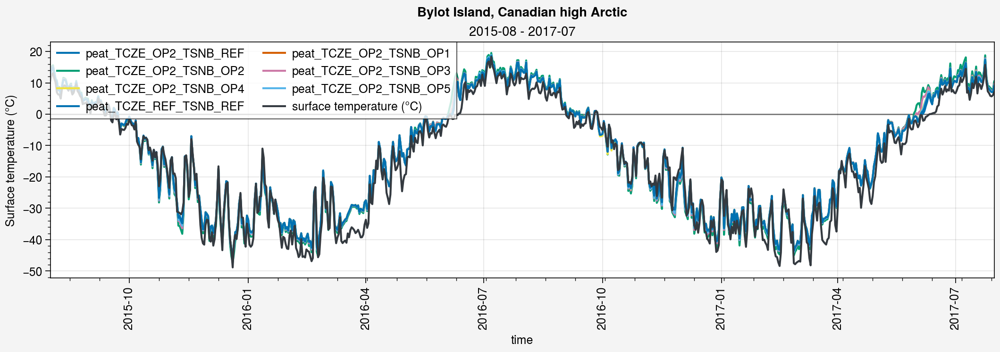

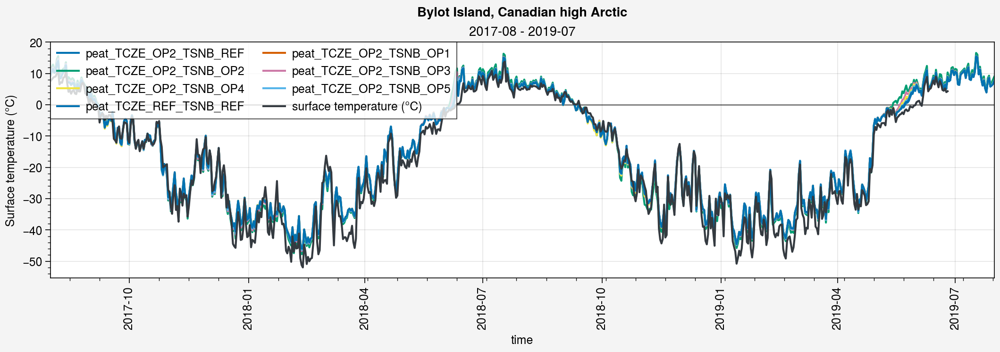

In [29]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label)
    
    # Obs
    axs[0].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

<a list of 5 Line2D objects>

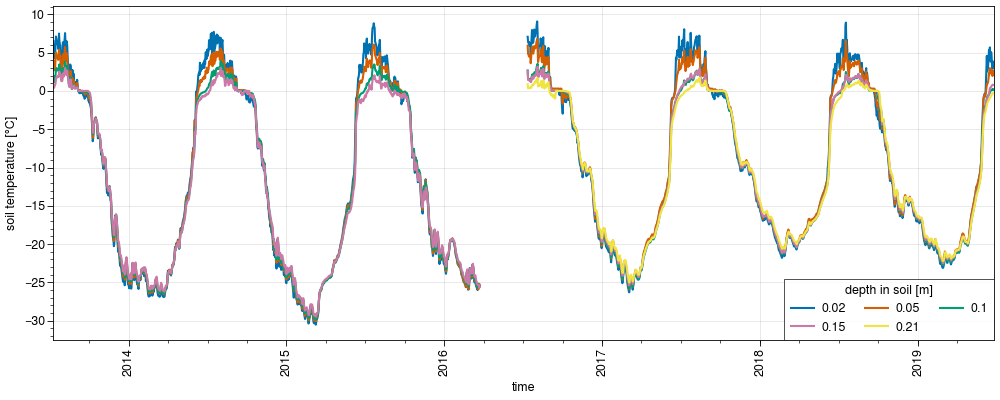

In [30]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsl.plot(hue='sdepth')

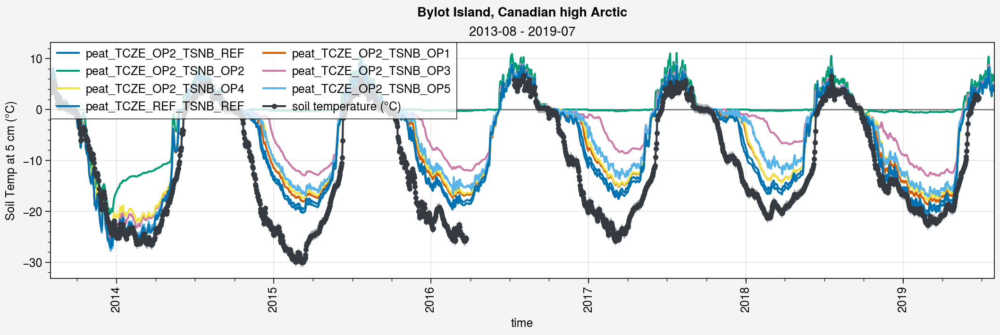

In [31]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth)-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


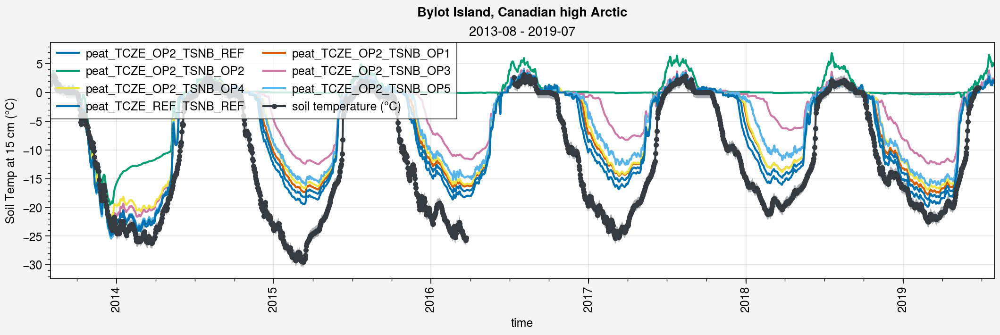

In [32]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


### Snow temperature

<a list of 10 Line2D objects>

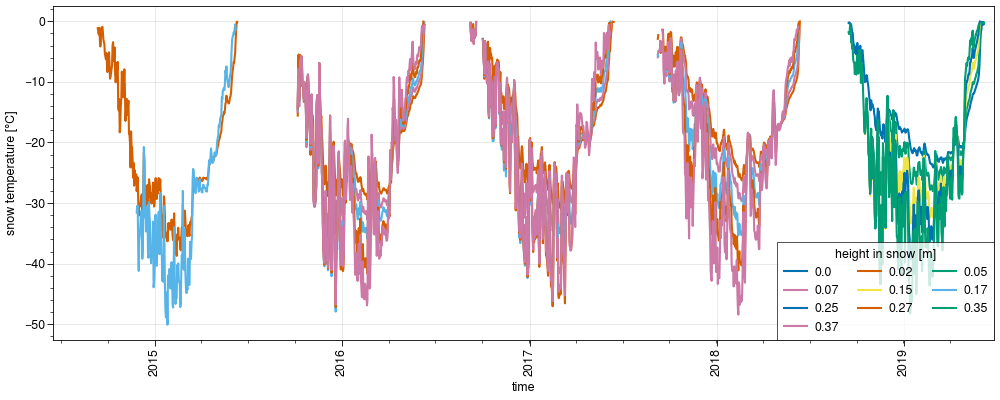

In [33]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsnl.plot(hue='sheight')

In [34]:
ds_d_obs.tsnl

<xarray.DataArray 'tsnl' (time: 2176, sheight: 10)> Size: 174kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * sheight  (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.25 0.27 0.35 0.37
  * time     (time) datetime64[ns] 17kB 2013-07-11 2013-07-12 ... 2019-06-25
Attributes:
    long_name:  snow temperature
    units:      °C

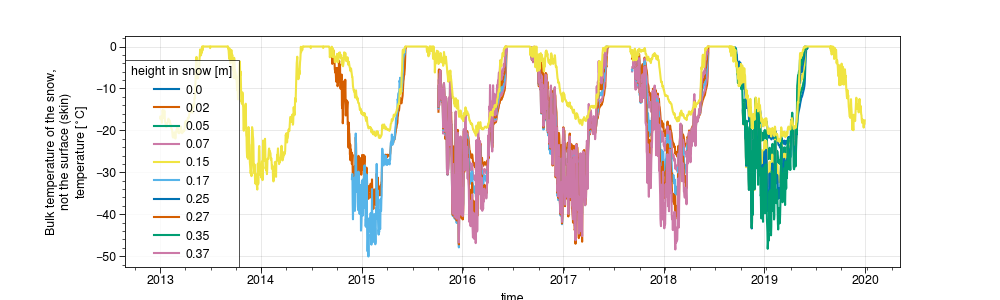

In [35]:
%matplotlib widget
plt.figure(figsize=(10,3))
ds_d_obs.tsnl.plot(hue='sheight')
# ds_d_obs.ts.plot(color='black')
ds_d_list[0].tsn.plot()
# (ds_d_list[0].ts-273.15).plot(color='red')


In [36]:
date = '2016-02-01'
def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
c = (ds_d_list[0].sel(time=date).ts-273.15).values
b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
a = (-b/ds_d_list[0].sel(time=date).snd).values
tsn_theoric = T(z, a, b, c)

tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
# print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
print('Snow temperature from model: {:.2f}'.format(ds_d.sel(time=date).tsn.values.item(0))+' °C')

Theoric snow temperature (model): -18.41 °C
Snow temperature from model: -19.31 °C


In [37]:
tsn_theoric

array([-37.07119563, -35.94042373, -34.8329667 , -33.74882457,
       -32.68799731, -31.65048495, -30.63628746, -29.64540486,
       -28.67783715, -27.73358432, -26.81264638, -25.91502332,
       -25.04071514, -24.18972185, -23.36204345, -22.55767992,
       -21.77663129, -21.01889754, -20.28447867, -19.57337469,
       -18.88558559, -18.22111138, -17.57995205, -16.9621076 ,
       -16.36757804, -15.79636337, -15.24846358, -14.72387867,
       -14.22260865, -13.74465352, -13.29001327, -12.8586879 ,
       -12.45067742, -12.06598182, -11.70460111, -11.36653528,
       -11.05178434, -10.76034828, -10.49222711, -10.24742082,
       -10.02592941,  -9.82775289,  -9.65289126,  -9.50134451,
        -9.37311264,  -9.26819566,  -9.18659356,  -9.12830635,
        -9.09333403,  -9.08167658])

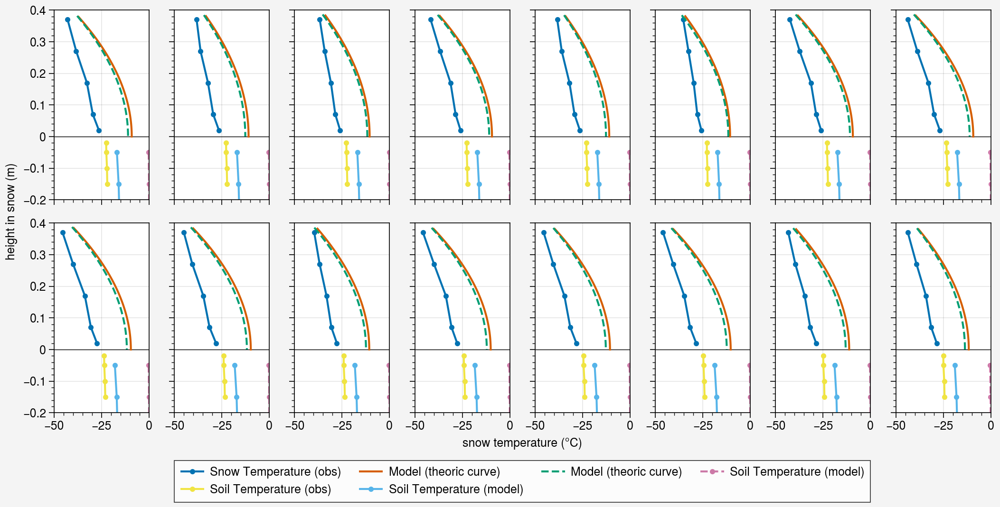

In [38]:
%matplotlib inline
import math
data_range = pd.date_range('2016-02-01', '2016-02-16')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
    c = (ds_d_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')



    z = np.linspace(0, ds_d_list[2].sel(time=date).snd.squeeze())
    c = (ds_d_list[2].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[2].sel(time=date).snd)*(c-ds_d_list[1].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[2].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)', ls='--')
    axs[i].plot(ds_d_list[2].tsl.sel(time=date)-273.15, -ds_d_list[2].layer, label='Soil Temperature (model)', marker='.', ls='--')

    
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 0), ylim=(-0.2, 0.4))
    axs[i].hlines(0, -50, 0, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

#### Add tsn to ds_d_obs
Results done bellow are very close to the average actually but that's a bit more correct to do like this. 

In [39]:
ds_d_obs['tsn'] = ds_d_obs.snd_auto.copy()*np.nan

for i, day in enumerate(ds_d_obs.time.values):
    # Get only values lower than the measured surface temperature
    ds_temp = ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').where(
        ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').sheight < ds_d_obs.snd_auto.sel(time=day).values,
        drop=True
    )
    ds_temp

    if ds_temp.shape[0] > 0:
        # Append the surface temperature and compute the average
        tsn = np.trapz(
            np.append(ds_temp.values, ds_d_obs.ts.sel(time=day).values),
            np.append(ds_temp.sheight.values, ds_d_obs.snd_auto.sel(time=day).values)
        )/(ds_d_obs.snd_auto.sel(time=day).values-ds_temp.sheight.values[0])

    else:
        tsn = np.nan

    ds_d_obs['tsn'][i] = tsn

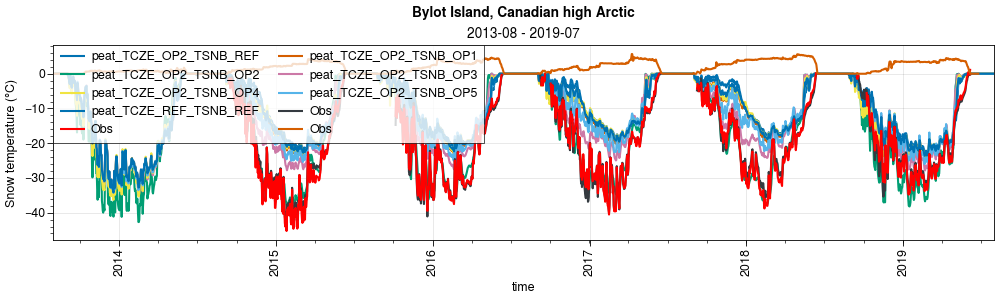

In [40]:
%matplotlib widget
gap = 6
color_obs = 'gray8'

for i in range(tot_year//gap):
    # fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(10,3))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.tsn.sel(time=period), label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.tsnl.mean('sheight').sel(time=period), color=color_obs, label='Obs')
    axs[0].plot(ds_d_obs.tsn.sel(time=period), color='red', label='Obs')
    
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period)*10, label='Obs')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Snow temperature (°C)')
    
    fig.suptitle(site_longname)


#### Compute TSNBOT_TH for all timesteps
T(z) = 1/2az² + bz + c

z axis towards the bottom

In [41]:
TSNBOT_obs = (ds_h_obs.tsnl.sel(sheight=0.02) + ds_h_obs.tsl.sel(sdepth=0.02))/2
TSNBOT_obs = TSNBOT_obs.combine_first(ds_h_obs.tsnl.sel(sheight=0.00)) # add the 2019 year with exact TSNBOT value

In [42]:
TSNBOT_obs_day = (ds_d_obs.tsnl.sel(sheight=0.02) + ds_d_obs.tsl.sel(sdepth=0.02))/2
TSNBOT_obs_day = TSNBOT_obs_day.combine_first(ds_d_obs.tsnl.sel(sheight=0.00)) # add the 2019 year with exact TSNBOT value

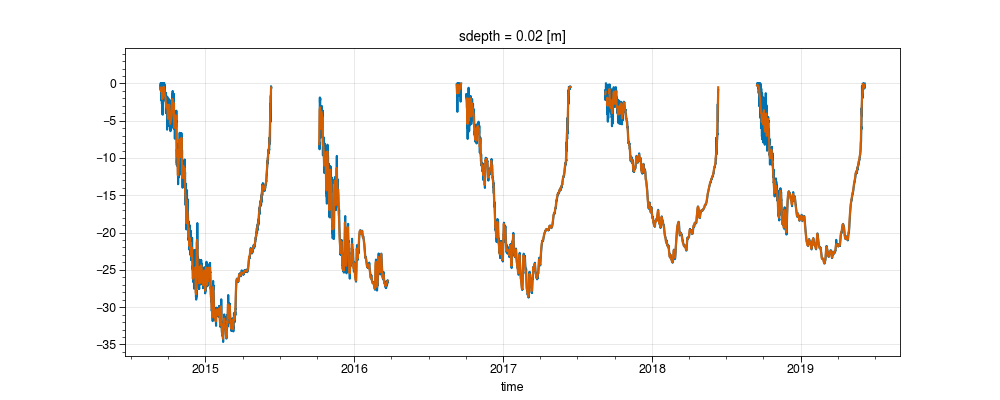

In [43]:
%matplotlib widget
plt.figure(figsize=(10, 4))
TSNBOT_obs.plot()
TSNBOT_obs_day.plot()

### Volumetric water content

https://medium.com/@wenzhao.li1989/soil-moisture-convert-mm-kg-m-2-and-m%C2%B3-m-3-e52be1fe98ef

The NCA-LDAS dataset currently provide soil moisture values in units of [m³ m-3] for volumetric soil moisture. To convert to units of [kg m-2] for the total soil moisture amount in each layer, all you do is multiply the [m³ m-3] value by the thickness of the layer in [mm].

<a list of 5 Line2D objects>

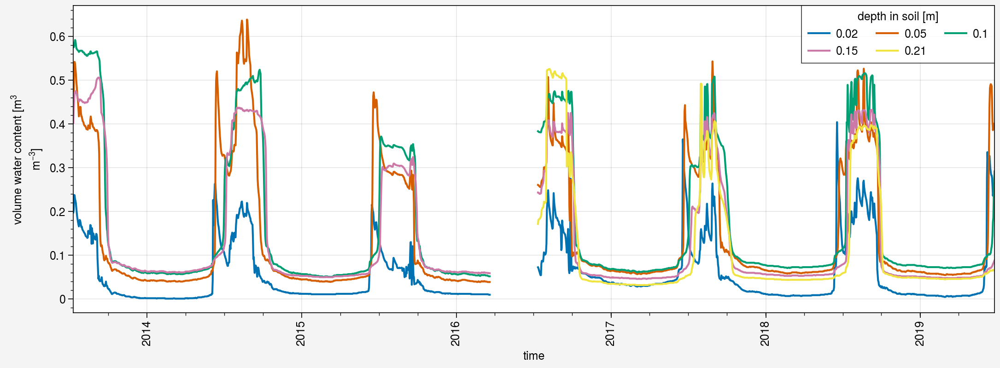

In [44]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_d_obs.mrsll.plot(hue='sdepth')

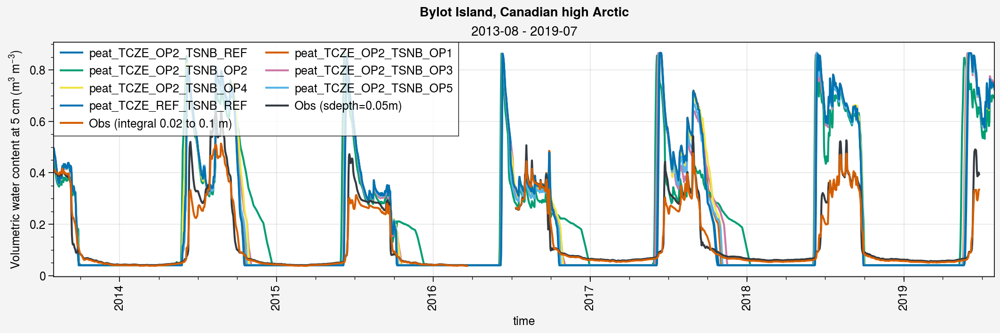

In [45]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth)/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02)), label='Obs (integral 0.02 to 0.1 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


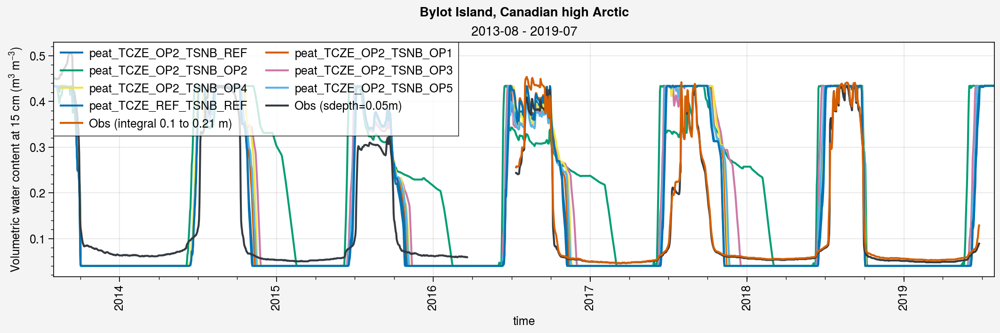

In [46]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1)), label='Obs (integral 0.1 to 0.21 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


### Thermal conductivity

<a list of 1 Line2D objects>

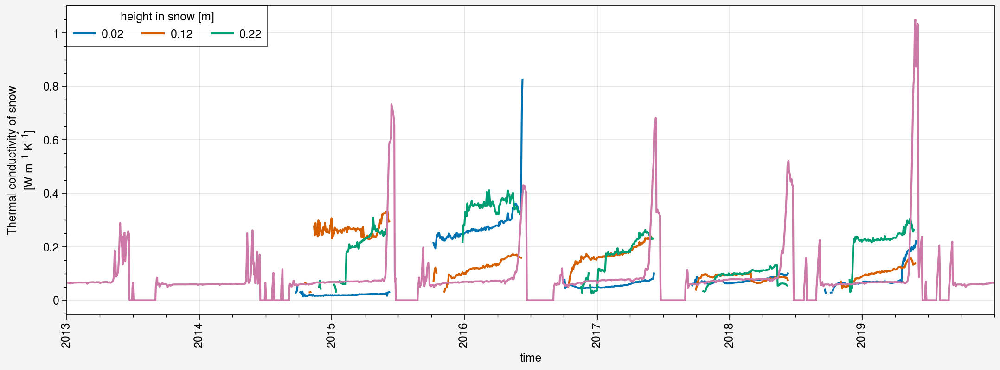

In [47]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tcs.plot(hue='sheight')
ds_d_list[0].tcsnow.plot()

#### Compute the effective thermal conductivity

In [48]:
sd = ds_d_obs.snd_auto.sel(time=ds_obs_tc.tcs.time)
z1 = sd.copy(); z2 = sd.copy(); z3 = sd.copy()
z1.values = [0.02]*sd.size
z2.values = [0.12]*sd.size
z3.values = [0.22]*sd.size

dz1 = (z1 + z2)/2
dz2 = (z2 + z3)/2 - z1
dz3 = sd - (z2 + z3)/2

# Keep only values for sd higher than the sensor height
dz3 = dz3.where(z3 < sd)
dz2 = dz2.where(z2 < sd)
dz1 = dz1.where(z1 < sd)

In [49]:
tcs_hmean = sd.copy()
tcs_hmean.values = stats.hmean(ds_obs_tc.tcs, weights=[dz1, dz2, dz3], nan_policy='omit')
tcs_hmean

<xarray.DataArray 'snd_auto' (time: 1090)> Size: 9kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

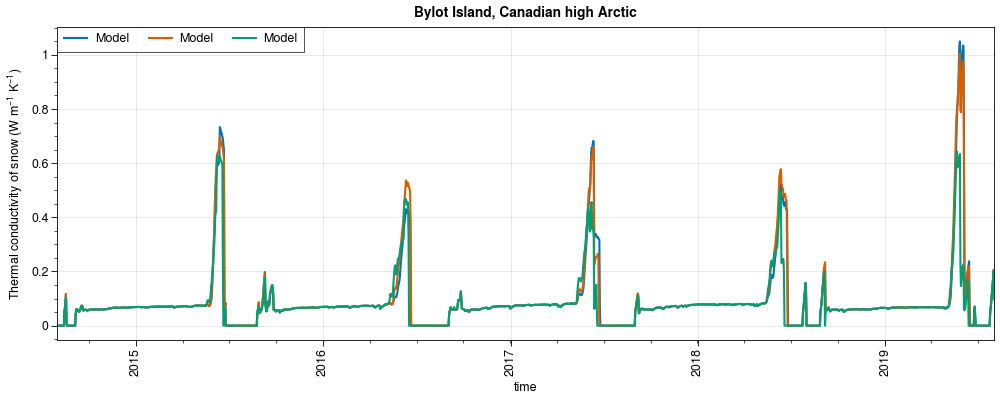

In [50]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[2].tcsnow.sel(time=period), label='Model')
# ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

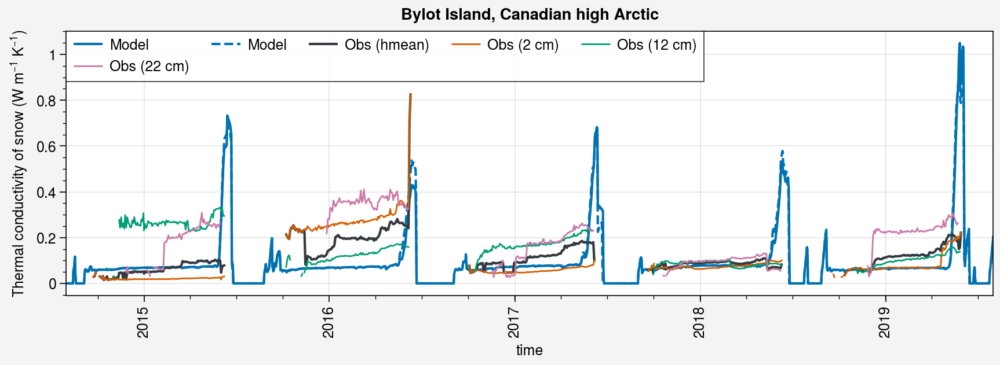

In [51]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model', c='C0', ls='--')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

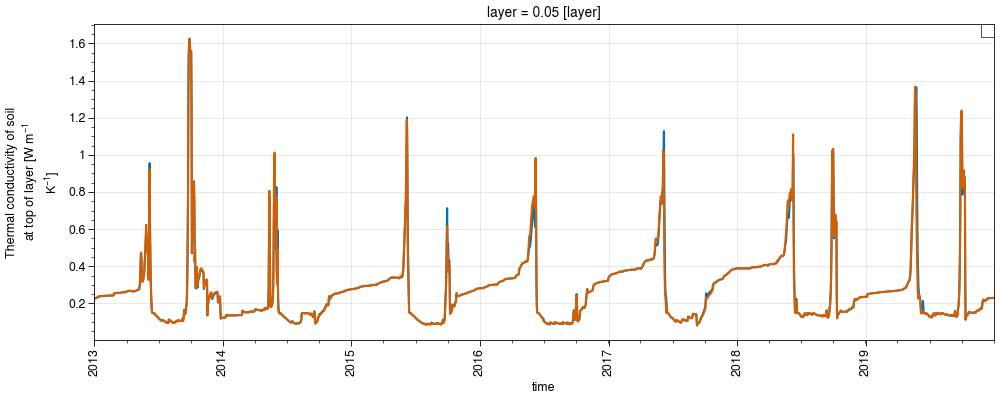

In [52]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

# ds_obs_tc.tc.plot(label='TC at 10 cm depth')
# tctop.sel(layer=[0.05, 0.15, 0.25], method='nearest').plot(hue='layer')
ds_d_list[0].tctop.sel(layer=0.05, method='nearest').plot()
ds_d_list[1].tctop.sel(layer=0.05, method='nearest').plot()
axs[0].legend()

## All 

/tmp/ipykernel_669555/727950754.py:68: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Float64DType'>) -> None
  ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
/tmp/ipykernel_669555/727950754.py:69: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Float64DType'>) -> None
  ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model', ls='--', c='C0')
/tmp/ipykernel_669555/727950754.py:70: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not cont

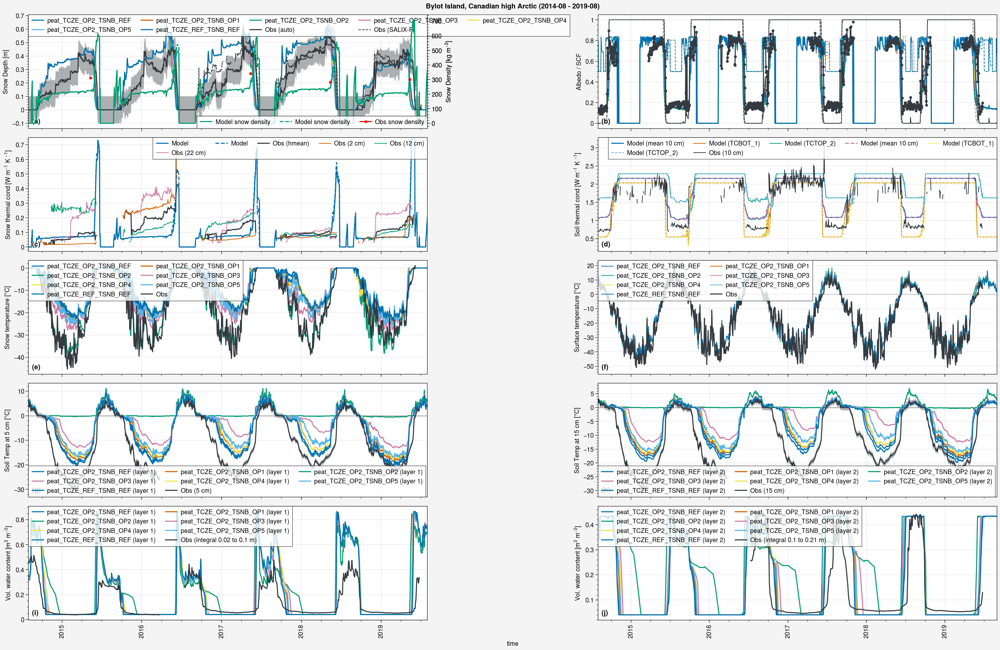

In [53]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-08')

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=8, sharey=0)
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.snd.sel(time=period), label=label)
    # axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

ox = ax.alty(label='Snow Density [kg m$^{-3}$]')
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C2', label='Model snow density')
ox.plot(ds_d_list[1].sel(time=period).snwdens, color='C2', label='Model snow density', ls='--')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='lr')
        
# ox = ax.alty(label='Snow Cover Fraction')
# ox.line(ds_d.snc.sel(time=period), label='SCF', color='grey6', lw=0.8, ls='--')
# ox.legend(loc='ur')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')

ax.legend(ncols=5, loc='ul')
ax.format(ylabel='Snow Depth [m]', 
          xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
         )

k += 1
##################
### Albedo ###
##################
ax = axs[k]
i=0
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(i))
    ax.plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(i), ls='--', lw=1)
    ax.plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color=color_obs, alpha=0.5, ls='--', lw=1)
    i+=1
# Obs
ax.plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs, label='Surface albedo obs')

# ax.legend(loc='ul', ncols=4)
ax.format(ylabel='Albedo / SCF')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[1].tcsnow.sel(time=period), label='Model', ls='--', c='C0')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    ylabel='Snow thermal cond [W m$^{-1}$ K $^{-1}$]',
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
    ylim=(-0.03, 0.75)
)
ax.legend(ncols=5)


k += 1
##################
### Thermal cond soil ###
##################
ax = axs[k]

mean = 0.5*ds_d_list[0].tctop.sel(layer=0.15, method='nearest') + 0.5*ds_d_list[0].tcbot.sel(layer=0.05, method='nearest')
ax.plot(mean.sel(time=period), label='Model (mean 10 cm)')
ax.plot(ds_d_list[0].tcbot.sel(layer=0.05, method='nearest').sel(time=period), label='Model (TCBOT_1)', lw=1)
ax.plot(ds_d_list[0].tctop.sel(layer=0.15, method='nearest').sel(time=period), label='Model (TCTOP_2)', lw=1)

mean = 0.5*ds_d_list[1].tctop.sel(layer=0.15, method='nearest') + 0.5*ds_d_list[1].tcbot.sel(layer=0.05, method='nearest')
ax.plot(mean.sel(time=period), label='Model (mean 10 cm)', ls='--')
ax.plot(ds_d_list[1].tcbot.sel(layer=0.05, method='nearest').sel(time=period), label='Model (TCBOT_1)', lw=1, ls='--')
ax.plot(ds_d_list[1].tctop.sel(layer=0.15, method='nearest').sel(time=period), label='Model (TCTOP_2)', lw=1, ls='--')


ax.plot(ds_obs_tc.tc.sel(time=period, sdepth=0.1), label='Obs (10 cm)', lw=1, color=color_obs)

ax.format(
    ylabel='Soil thermal cond [W m$^{-1}$ K $^{-1}$]',
)
ax.legend(ncols=5)


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label)
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, label='Obs')

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Snow temperature [°C]')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1, zorder=2)

# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, label='Obs')
ax.hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c=color_obs, lw=0.5, alpha=0.5)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Surface temperature [°C]')


k += 1
##################
### T soil ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 5 cm [°C]')
ax.legend()

k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 15 cm [°C]')
ax.legend()

k += 1
##################
### SWC ###
##################
ax = axs[k]
sdepth = 0.05
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label+' (layer 1)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1], method='nearest').integrate('sdepth')/(0.1-0.02)), 
            label='Obs (integral 0.02 to 0.1 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')

k += 1
ax = axs[k]
sdepth = 0.15
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label+' (layer 2)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21], method='nearest').integrate('sdepth')/(0.21-0.1)), 
            label='Obs (integral 0.1 to 0.21 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ll')

# fig.save('img/'+site+'_all_2014-2019.jpg')
# fig.save('img/'+site+'_all_2014-2019.pdf')

In [56]:
column_indexes = [['Obs'] + labels]

row_indexes = [['snd_auto', 'snwdens', 'ts', 'tsn', 'tsnbot', 'tsl_5', 'tsl_15'], ['ME', 'RMSE']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=column_indexes)
df_metrics.loc[:, ('Obs', slice(None))] = 0
df_metrics

Obs peat_TCZE_OP2_TSNB_REF peat_TCZE_OP2_TSNB_OP1  \
snd_auto ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
snwdens  ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
ts       ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
tsn      ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
tsnbot   ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
tsl_5    ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   
tsl_15   ME     0                    NaN                    NaN   
         RMSE   0                    NaN                    NaN   

              peat_TCZE_OP2_TSNB_OP2 peat_TCZE_OP2_TSNB_OP3  \
snd_auto ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
snwdens  ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
ts       ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsn      ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsnbot   ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsl_5    ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsl_15   ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   

              peat_TCZE_OP2_TSNB_OP4 peat_TCZE_OP2_TSNB_OP5  \
snd_auto ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
snwdens  ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
ts       ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsn      ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsnbot   ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsl_5    ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   
tsl_15   ME                      NaN                    NaN   
         RMSE                    NaN                    NaN   

              peat_TCZE_REF_TSNB_REF  
snd_auto ME                      NaN  
         RMSE                    NaN  
snwdens  ME                      NaN  
         RMSE                    NaN  
ts       ME                      NaN  
         RMSE                    NaN  
tsn      ME                      NaN  
         RMSE                    NaN  
tsnbot   ME                      NaN  
         RMSE                    NaN  
tsl_5    ME                      NaN  
         RMSE                    NaN  
tsl_15   ME                      NaN  
         RMSE                    NaN

In [178]:
# ds_d_obs = ds_d_obs.drop_vars('snwdens')
# ds_d_obs

<xarray.Dataset> Size: 453kB
Dimensions:         (time: 2176, sdepth: 5, sheight: 10)
Coordinates:
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
  * time            (time) datetime64[ns] 17kB 2013-07-11 ... 2019-06-25
Data variables:
    snd_auto        (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 17kB 0.1815 0.1357 0.1493 ... 0.1625 0.1964
    flag_albs_ERA5  (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ts              (time) float64 17kB 11.03 5.161 6.706 ... 5.245 4.045 4.336
    mrsll           (time, sdepth) float64 87kB 0.1981 0.4431 ... 0.08873 0.066
    tsl             (time, sdepth) float64 87kB 6.497 3.928 1.357 ... 0.79 -0.3
    tsnl            (time, sheight) float64 174kB nan nan nan ... nan nan nan
    tsn             (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

In [57]:
ds_d_obs = ds_d_obs.assign({'snwdens': ('time', [np.nan]*ds_d_obs.time.size)})
ds_d_obs

<xarray.Dataset> Size: 470kB
Dimensions:         (time: 2176, sdepth: 5, sheight: 10)
Coordinates:
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
  * time            (time) datetime64[ns] 17kB 2013-07-11 ... 2019-06-25
Data variables:
    snd_auto        (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 17kB 0.1815 0.1357 0.1493 ... 0.1625 0.1964
    flag_albs_ERA5  (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ts              (time) float64 17kB 11.03 5.161 6.706 ... 5.245 4.045 4.336
    mrsll           (time, sdepth) float64 87kB 0.1981 0.4431 ... 0.08873 0.066
    tsl             (time, sdepth) float64 87kB 6.497 3.928 1.357 ... 0.79 -0.3
    tsnl            (time, sheight) float64 174kB nan nan nan ... nan nan nan
    tsn             (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
    snwdens         (time) float64 17kB nan nan nan nan nan ... nan nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

In [58]:
ds_d_obs.snwdens.mean()

<xarray.DataArray 'snwdens' ()> Size: 8B
array(nan)

In [59]:
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ds_d_obs.snwdens.loc[dict(time=tundra_df.index[0])] = np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz

In [60]:
ds_d_obs.snwdens.mean()

<xarray.DataArray 'snwdens' ()> Size: 8B
array(306.57752523)

/tmp/ipykernel_669555/3688611767.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
/tmp/ipykernel_669555/3688611767.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
/tmp/ipykernel_669555/3688611767.py:72: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits onl

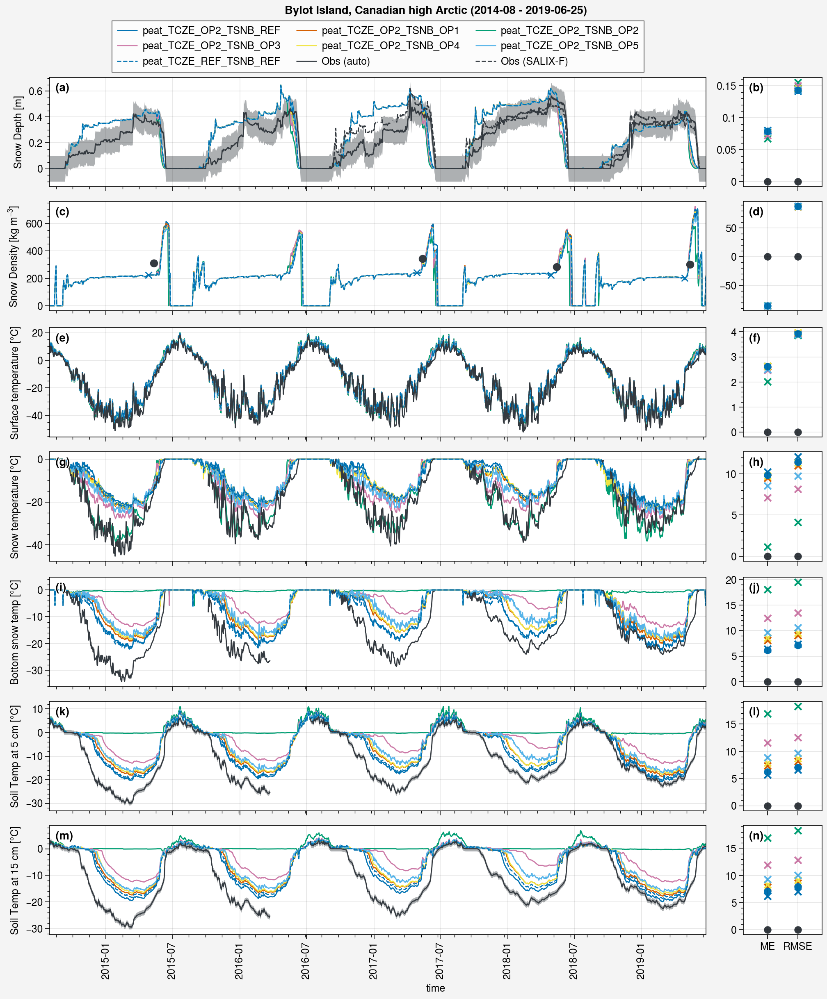

In [65]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-06-25')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=7, ncols=2, refaspect=6, refwidth=8, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.snd.sel(time=period), label=label, lw=1)
    else:
        ax.plot(ds_d.snd.sel(time=period), label=label, lw=1, ls='--', c='C0')

    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')
ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('snd_auto', 'peat_TCZE_REF_TSNB_REF')], color='C0')
ax.format(xlim=(-0.8, 1.8))

 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1)
    else:
        ax.plot(ds_d.snwdens.sel(time=period), label=label, lw=1, ls='--', c='C0')
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=15), 
                                                        ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=15), 
                                                      ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_list[0].snwdens.sel(time=period).shift(time=15).where(ds_d_obs.snwdens.sel(time=period) > 0).shift(time=-15), 
        color='C0', marker='x')
ax.plot(ds_d_obs.snwdens.sel(time=period), color=color_obs, marker='o')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('snwdens', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)
    else:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1, ls='--', c='C0')
    df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                        ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
                                                      ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('ts', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('ts', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1)
    else:
        ax.plot(ds_d.tsn.sel(time=period), label=label, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Snow temperature [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('tsn', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('tsn', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### TSNBOT ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label, lw=1)
    else:
        ax.plot(ds_d.tsnbot.sel(time=period), label=label, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                        TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
                                                      TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
ax.plot(TSNBOT_obs_day.sel(time=period), color=color_obs, lw=1) 
ax.format(ylabel='Bottom snow temp [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('tsnbot', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('tsnbot', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label, lw=1)
    else:
        ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsl_5', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_5', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period, layer=0.05).where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.05).where(mask_sd), skipna=True)).values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)', lw=1)
ax.format(ylabel='Soil Temp at 5 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_5'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('tsl_5', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('tsl_5', 'peat_TCZE_REF_TSNB_REF')], color='C0')



k += 1
ax = axs[k]
# Simus
for i, (ds_d, label) in enumerate(zip(ds_d_list, labels)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label, lw=1)
    else:
        ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsl_15', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_15', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)', lw=1)
ax.format(ylabel='Soil Temp at 15 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:-1]], marker='x')
ax.scatter(df_metrics.loc[('tsl_15', 'Obs')], color=color_obs)
ax.scatter(df_metrics.loc[('tsl_15', 'peat_TCZE_REF_TSNB_REF')], color='C0')




# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label in zip(ds_d_list, labels):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=3, loc='t')


# fig.save('img/'+site+'_peat_TCZE_OP2_TSNB_ALL_2014-2019.pdf')

In [66]:
df_metrics

Obs peat_TCZE_OP2_TSNB_REF peat_TCZE_OP2_TSNB_OP1  \
snd_auto ME     0    0.08043420249376732    0.07749179151885237   
         RMSE   0    0.14149819459671595    0.14470771467390375   
snwdens  ME     0     -85.88418158947186     -85.77068394614109   
         RMSE   0      87.59451341227998      87.49568290473934   
ts       ME     0      2.636494164592956      2.608515089604691   
         RMSE   0     3.9111233212941463      3.930988640168124   
tsn      ME     0     10.239613372842031      9.508782880087141   
         RMSE   0      12.06993811823496      10.98976672855696   
tsnbot   ME     0      6.405774939803808       8.08358517576368   
         RMSE   0      7.382299257284092      9.025797829991488   
tsl_5    ME     0      5.712073549384782      7.354689810570648   
         RMSE   0      6.585415693779601      8.167493135767957   
tsl_15   ME     0      6.237354538392399      7.837286313218853   
         RMSE   0     7.0299288006872285      8.605173161881513   

              peat_TCZE_OP2_TSNB_OP2 peat_TCZE_OP2_TSNB_OP3  \
snd_auto ME      0.06731393242670726    0.07266387119289949   
         RMSE    0.15532595962886545     0.1501067940742011   
snwdens  ME       -85.57151668383918      -85.6655308302567   
         RMSE      87.28223613011689      87.39953217675965   
ts       ME        2.005033807963412     2.4616489601683718   
         RMSE     3.8589124867294426       3.93101882639737   
tsn      ME        1.128881809817032      7.081138291605112   
         RMSE      4.092247871195665      8.137350331816204   
tsnbot   ME        18.04951623252301     12.410364986201024   
         RMSE      19.48111792254851     13.494357708275622   
tsl_5    ME        16.87256017898952     11.563125650032825   
         RMSE       18.2394734613048     12.515967189735056   
tsl_15   ME        16.94528854689936      11.92862232081425   
         RMSE     18.281477054391765     12.856896265692704   

              peat_TCZE_OP2_TSNB_OP4 peat_TCZE_OP2_TSNB_OP5  \
snd_auto ME      0.07776842585165852    0.07838110183403423   
         RMSE    0.14552633326818143    0.14383270559964215   
snwdens  ME       -85.69129055831539     -85.84166422849376   
         RMSE      87.42145267036662      87.55423080469578   
ts       ME       2.6355315798880845     2.5090856200295826   
         RMSE      3.965600529859171      3.884281395181426   
tsn      ME        9.746124957356272      8.547966223797822   
         RMSE     11.327870085522969      9.727560577117321   
tsnbot   ME        8.598040140919412      9.646834462857054   
         RMSE      9.549528166940819     10.618197752269214   
tsl_5    ME       7.8772637310327855       8.84752980722286   
         RMSE      8.703850498195015      9.682312605478632   
tsl_15   ME        8.358427649710553      9.279889396014802   
         RMSE      9.157781821893305     10.074950409388665   

              peat_TCZE_REF_TSNB_REF  
snd_auto ME      0.07869794857385418  
         RMSE    0.14297915624166604  
snwdens  ME       -85.84592765830988  
         RMSE      87.55513076532067  
ts       ME       2.6210269175328538  
         RMSE     3.9204802294350913  
tsn      ME        9.836889711687151  
         RMSE     11.446460198938096  
tsnbot   ME        6.142692328177649  
         RMSE     7.1069352751618835  
tsl_5    ME        6.244046088801646  
         RMSE      7.065797789268844  
tsl_15   ME        7.152181317655379  
         RMSE      7.908408502479079